In [62]:
import xarray as xr
#import rioxarray as rxr
import xesmf as xe
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter
import string
from scipy import interpolate
from scipy.stats import linregress
from scipy import ndimage as ndi

from pyproj import CRS,Transformer,Proj
import time
import os

from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

import sys
sys.path.insert(1, '/home/castelli/Notebooks/PhD/utils') # to include my util file in previous directory
import utils as u
u.check_python_version()

3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]


In [2]:
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-EC-Earth3/MARgrid_EUe.nc')

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
lon = np.array(ds.LON[jmin:jmax,imin:imax])
lat = np.array(ds.LAT[jmin:jmax,imin:imax])
H = np.array(ds.SH[jmin:jmax,imin:imax])
nlat,nlon = 91, 139

normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
big_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
              'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[41.,50],'lonlim':[0.,20.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False, 'lonlines':2,
                    'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}


In [3]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool_(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False

alps = ndi.binary_fill_holes(alps) # fill tiny hole in contour

In [4]:
def mask_by_label(ds, labels, value):
    mask = xr.DataArray(
        labels == value,
        coords={"time": ds.time},
        dims="time"
    )
    return ds.where(mask, drop=True)

In [5]:
def plot_four(ds_precip, title, cbar_label,dict_WT):
    pplt.rc.update(small=12, large=14)

    f, axs = pplt.subplots(proj='cyl', ncols=2,nrows=2, axwidth=5, axheight=2.5)

    colmap = 'BrBG'
    levels_WT = np.arange(-70,80,10)

    labels_dataset = list(dict_WT.values())
    keys_WT = list(dict_WT.keys())

    mean_precip = ds_precip['pr'].mean(dim='time')

    for lab in range(4):
        m=axs[lab].pcolormesh(lon, lat, 100*(ds_precip[labels_dataset[lab]].mean(dim='time')-mean_precip)/mean_precip, levels=levels_WT,cmap=colmap)
        axs[lab].contour(lon, lat, alps)
        axs[lab].format(title=keys_WT[lab],titlesize='15px')

    f.colorbar(m,label= cbar_label,labelsize='x-large',ticklabelsize='large')

    f.format(**normal_format)
    f.format(ocean=False,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],
             suptitle=title)

In [6]:
def plot_five(ds_precip, title, title1, cbar_label,dict_WT):
    pplt.rc.update(small=12, large=14)

    f, axs = pplt.subplots([[1, 1], [1, 1], [2, 3], [4, 5]], refnum=1, refwidth=7, proj='cyl')#,axwidth=3)

    mean_precip = ds_precip['pr'].mean(dim='time')

    m=axs[0].pcolormesh(lon, lat, mean_precip, levels = np.arange(0,11,1),cmap='Blues')
    axs[0].contour(lon, lat, alps)
    axs[0].format(title=title1,titlesize='15px')
    
    colmap = 'BrBG'
    levels_WT = np.arange(-70,80,10)

    labels_dataset = list(dict_WT.values())
    keys_WT = list(dict_WT.keys())

    for lab in range(4):
        m2=axs[lab+1].pcolormesh(lon, lat, 100*(ds_precip[labels_dataset[lab]].mean(dim='time')-mean_precip)/mean_precip, levels=levels_WT,cmap=colmap)
        axs[lab+1].contour(lon, lat, alps)
        axs[lab+1].format(title=keys_WT[lab],titlesize='15px')

    f.colorbar(m,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='r',rows=(1,2),length=0.9)
    f.colorbar(m2,label= cbar_label,labelsize='x-large',ticklabelsize='large',rows=(3,4),length=0.9)

    f.format(**multiplot_format)
    f.format(ocean=False,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],
             suptitle=title)

In [7]:
def plot_five_change(ds_precip1, ds_precip2, title, title1, cbar_label, dict_WT1, dict_WT2):
    pplt.rc.update(small=12, large=14)

    f, axs = pplt.subplots([[1, 1], [1, 1], [2, 3], [4, 5]], refnum=1, refwidth=7, proj='cyl')#,axwidth=3)

    mean1 = ds_precip1['pr'].mean(dim='time')
    mean2 = ds_precip2['pr'].mean(dim='time')
    mean_change = 100*(mean2-mean1)/mean1

    m=axs[0].pcolormesh(lon, lat, mean_change, levels = np.arange(-80,81,10),cmap='BrBG')
    axs[0].contour(lon, lat, alps)
    axs[0].format(title=title1,titlesize='15px')
    
    colmap = 'BrBG'
    levels_WT = np.arange(-80,81,10)

    keys = list(dict_WT1.keys())

    for lab in range(4):
        # print(keys[lab])
        # print(dict_WT1[keys[lab]])
        # print(dict_WT2[keys[lab]])
        mean1 = ds_precip1[dict_WT1[keys[lab]]].mean(dim='time')
        mean2 = ds_precip2[dict_WT2[keys[lab]]].mean(dim='time')
        m2=axs[lab+1].pcolormesh(lon, lat, 100*(mean2-mean1)/mean1, levels=levels_WT,cmap=colmap)
        axs[lab+1].contour(lon, lat, alps)
        axs[lab+1].format(title=keys[lab],titlesize='15px')

    f.colorbar(m,label= cbar_label,labelsize='x-large',ticklabelsize='large',loc='r',length=0.9)

    f.format(**multiplot_format)
    f.format(ocean=False,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],
             suptitle=title)

In [8]:
def plot_five_change2(ds_precip1, ds_precip2, title, title1, cbar_label, freq1, freq2, TW):
    pplt.rc.update(small=12, large=14)

    f, axs = pplt.subplots([[1, 1], [1, 1], [2, 3], [4, 5]], refnum=1, refwidth=7, proj='cyl')#,axwidth=3)

    mean1 = ds_precip1['pr'].mean(dim='time')
    mean2 = ds_precip2['pr'].mean(dim='time')
    mean_change = 100*(mean2-mean1)/mean1

    m=axs[0].pcolormesh(lon, lat, mean_change, levels = np.arange(-80,81,10),cmap='BrBG')
    axs[0].contour(lon, lat, alps)
    axs[0].format(title=title1,titlesize='15px')
    
    colmap = 'BrBG'
    levels_WT = np.arange(-80,81,10)

    for i,WT in enumerate(TW.keys()):
        mean1 = ds_precip1[WT].mean(dim='time')
        mean2 = ds_precip2[WT].mean(dim='time')
        m2=axs[i+1].pcolormesh(lon, lat, 100*(mean2-mean1)/mean1, levels=levels_WT,cmap=colmap)
        axs[i+1].contour(lon, lat, alps)
        #title_subplot = WT+', TW = %2.2f' %(TW[WT])+', freq : %2.2f' %(freq1[i])+'% to %2.2f' %(freq2[i])+'%'
        title_subplot = (f"{WT}, TW = {TW[WT]:.2f}, "f"freq : {freq1[i]:.2f}% to {freq2[i]:.2f}%")

        axs[i+1].format(title=title_subplot,titlesize='15px')

    f.colorbar(m,label= cbar_label,labelsize='x-large',ticklabelsize='large',loc='r',length=0.9)

    f.format(**multiplot_format)
    f.format(ocean=False,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],
             suptitle=title)

In [9]:
def tws_paper_weighted(da1, da2):
    """
    Teweles–Wobus Score (paper Blanc et al. 2022 formulation)
    WITH cosine latitude weighting.

    Parameters
    ----------
    da1, da2 : xarray.DataArray
        dims ('label', 'lat', 'lon')

    Returns
    -------
    float
        Weighted TWS between 0 and 1
    """

    TW_score = {'NAO+': 0, 'Blocking': 0, 'NAO-': 0, 'Atlantic ridge': 0}

    for WT in da1.label.values:
        Z1 = da1.sel(label=WT)
        Z2 = da2.sel(label=WT)
        # Cosine latitude weights
        coslat = np.cos(np.deg2rad(Z1.lat))

        # --- EAST-WEST differences ---
        dZ1_e = Z1.diff("lon")
        dZ2_e = Z2.diff("lon")

        num_e = abs(dZ1_e - dZ2_e)
        den_e = np.maximum(np.abs(dZ1_e), np.abs(dZ2_e))

        # weight by latitude (broadcast automatically)
        num_e = num_e * coslat
        den_e = den_e * coslat

        # --- NORTH-SOUTH differences ---
        dZ1_n = Z1.diff("lat")
        dZ2_n = Z2.diff("lat")

        num_n = abs(dZ1_n - dZ2_n)
        den_n = np.maximum(np.abs(dZ1_n), np.abs(dZ2_n))

        num_n = num_n * coslat
        den_n = den_n * coslat

        numerator = num_e.sum() + num_n.sum()
        denominator = 2 * (den_e.sum() + den_n.sum())

        TW_score[WT] = (numerator / denominator).item()

    return TW_score

In [10]:
def make_data_array(filein1, latin, lonin):

    arr_cen = np.load(filein1)
    arr_lat = np.load(latin)
    arr_lon = np.load(lonin)

    k, space = arr_cen.shape

    ### Re-shape the array
    centers = np.reshape(arr_cen, (k, len(arr_lat), len(arr_lon)))
    print('---> Shape of the centroids are: ', centers.shape)     #(k, lat, lon)

    ### Cosine of latitude (in radians)
    lat_rad = np.deg2rad(arr_lat)
    coslat = np.sqrt(np.cos(lat_rad))

    ### Divide centroid by cos(lat)
    centers_new = np.zeros((k, len(arr_lat), len(arr_lon)))
    for l in range(0,len(arr_lat)):
        centers_new[:,l,:] = centers[:,l,:]/coslat[l]

    da = xr.DataArray(
        data=centers_new,
        dims=["label", "lat", "lon"],
        coords=dict(
            label=[0,1,2,3],
            lat=arr_lat,
            lon=arr_lon
        ))
    return da

In [11]:
def centers_and_freq(m, case, season, yearstart, yearend, refone, mapping):
    rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

    if refone=='T':
        filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
        filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    if refone == 'F' and case != 'hist':
        filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
        filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    
    latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
    lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')
    
    da = make_data_array(filein1,latin,lonin)
    order = [int(v.replace('pr', '')) for v in mapping.values()]
    da_reordered = da.isel(label=order)
    da_reordered = da_reordered.assign_coords(
        label=list(mapping.keys())
    )
    
    idx = np.load(filein2)
    unique_elements, counts_elements = np.unique(idx, return_counts=True)
    freq_perc = counts_elements/len(idx) * 100
    freq_perc_reordered = freq_perc[order]

    return da_reordered, freq_perc_reordered

In [12]:
def remap(path, mapping):
    ds = xr.open_dataset(path)
    ds_out = xr.Dataset({'pr': ds['pr']})

    for new_name, old_name in mapping.items():
        ds_out[new_name] = ds[old_name]
    return ds_out

In [23]:
def make_ds_precip_yearly(path,start_yr,end_yr):

    t0 = time.perf_counter()
    
    years = range(start_yr, end_yr+1) # end_yr+1, because of the way "range" works

    path_MBrr = path+'MBrr.{year}.nc'
    path_MBsf = path+'MBsf.{year}.nc'
    files_MBrr = [path_MBrr.format(year=y) for y in years]
    files_MBsf = [path_MBsf.format(year=y) for y in years]

    print("Opening MBrr")
    # open files in dataset
    ds_MBrr = xr.open_mfdataset(files_MBrr, combine="by_coords").isel(y=slice(jmin,jmax),x=slice(imin,imax))
    # remove 29th of february to be consistent with labels
    ds_MBrr = ds_MBrr.sel(
        time=~((ds_MBrr.time.dt.month == 2) & (ds_MBrr.time.dt.day == 29))
    )

    t1 = time.perf_counter()
    print(f"Time : {t1 - t0:.3f} s")
    
    print("Opening MBsf")
    ds_MBsf = xr.open_mfdataset(files_MBsf, combine="by_coords").isel(y=slice(jmin,jmax),x=slice(imin,imax))
    ds_MBsf = ds_MBsf.sel(
        time=~((ds_MBsf.time.dt.month == 2) & (ds_MBsf.time.dt.day == 29))
    )

    t2 = time.perf_counter()
    print(f"Time : {t2 - t0:.3f} s")
    
    # Create precipitation data array
    print("Creating precip data arrays")
    
    da_precip = ds_MBrr["MBrr"] + ds_MBsf["MBsf"]

    t3 = time.perf_counter()
    print(f"Time : {t3 - t0:.3f} s")
    
    print("Creating precip dataset")
    ds_out = xr.Dataset({
        "pr": da_precip
    })
    ds_out["pr"].attrs = da_precip.attrs
    ds_out.attrs["Description"] = "Dataset with total precipitation (pr=rainfall+snowfall)"

    t4 = time.perf_counter()
    print(f"Time total : {t4 - t0:.3f} s")

    return ds_out
    # print("Saving dataset")
    
    # ds_out.to_netcdf(path_out)

    # t5 = time.perf_counter()
    # print(f"Time total : {t5 - t0:.3f} s")

In [13]:
# Dictionaries to associate the weather regime to the number found by K-means clustering

dict_WT_ERA5_1960_2009_NDJFM={'NAO+': 'pr0', 'Blocking': 'pr3', 'NAO-': 'pr2', 'Atlantic ridge': 'pr1'}
dict_WT_ERA5_1960_2009_JJA={'NAO+': 'pr2', 'Blocking': 'pr1', 'NAO-': 'pr3', 'Atlantic ridge': 'pr0'}


dict_WT_MPI_hist_1960_2009_NDJFM={'NAO+': 'pr2', 'Blocking': 'pr0', 'NAO-': 'pr3', 'Atlantic ridge': 'pr1'}
dict_WT_MPI_hist_1960_2009_JJA={'NAO+': 'pr3', 'Blocking': 'pr0', 'NAO-': 'pr1', 'Atlantic ridge': 'pr2'}
dict_WT_MPI_ssp245_2050_2099_NDJFM={'NAO+': 'pr0', 'Blocking': 'pr1', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'}
dict_WT_MPI_ssp245_2050_2099_JJA={'NAO+': 'pr2', 'Blocking': 'pr1', 'NAO-': 'pr0', 'Atlantic ridge': 'pr3'}
dict_WT_MPI_ssp585_2050_2099_NDJFM={'NAO+': 'pr3', 'Blocking': 'pr0', 'NAO-': 'pr2', 'Atlantic ridge': 'pr1'}
dict_WT_MPI_ssp585_2050_2099_JJA={'NAO+': 'pr1', 'Blocking': 'pr0', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'}

dict_WT_ECEarth3_hist_1960_2009_NDJFM={'NAO+': 'pr3', 'Blocking': 'pr1', 'NAO-': 'pr2', 'Atlantic ridge': 'pr0'}
dict_WT_ECEarth3_hist_1960_2009_JJA={'NAO+': 'pr0', 'Blocking': 'pr2', 'NAO-': 'pr1', 'Atlantic ridge': 'pr3'}
dict_WT_ECEarth3_ssp245_2050_2099_NDJFM={'NAO+': 'pr2', 'Blocking': 'pr3', 'NAO-': 'pr1', 'Atlantic ridge': 'pr0'}
dict_WT_ECEarth3_ssp245_2050_2099_JJA={'NAO+': 'pr1', 'Blocking': 'pr3', 'NAO-': 'pr2', 'Atlantic ridge': 'pr0'}



In [14]:
pplt.rc['figure.facecolor'] = 'white'


## Winter

/tmp/ipykernel_1013675/2647780523.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/2647780523.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

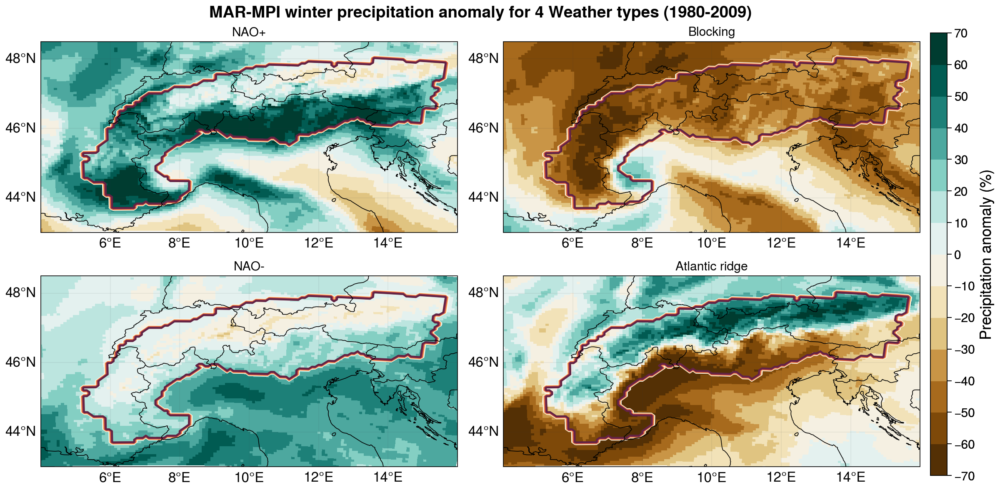

In [15]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1980-2009_winter.nc')

plot_four(ds_precip, 'MAR-MPI winter precipitation anomaly for 4 Weather types (1980-2009)', 'Precipitation anomaly (%)',
         dict_WT={'NAO+': 'pr3', 'Blocking': 'pr1', 'NAO-': 'pr0', 'Atlantic ridge': 'pr2'})

/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

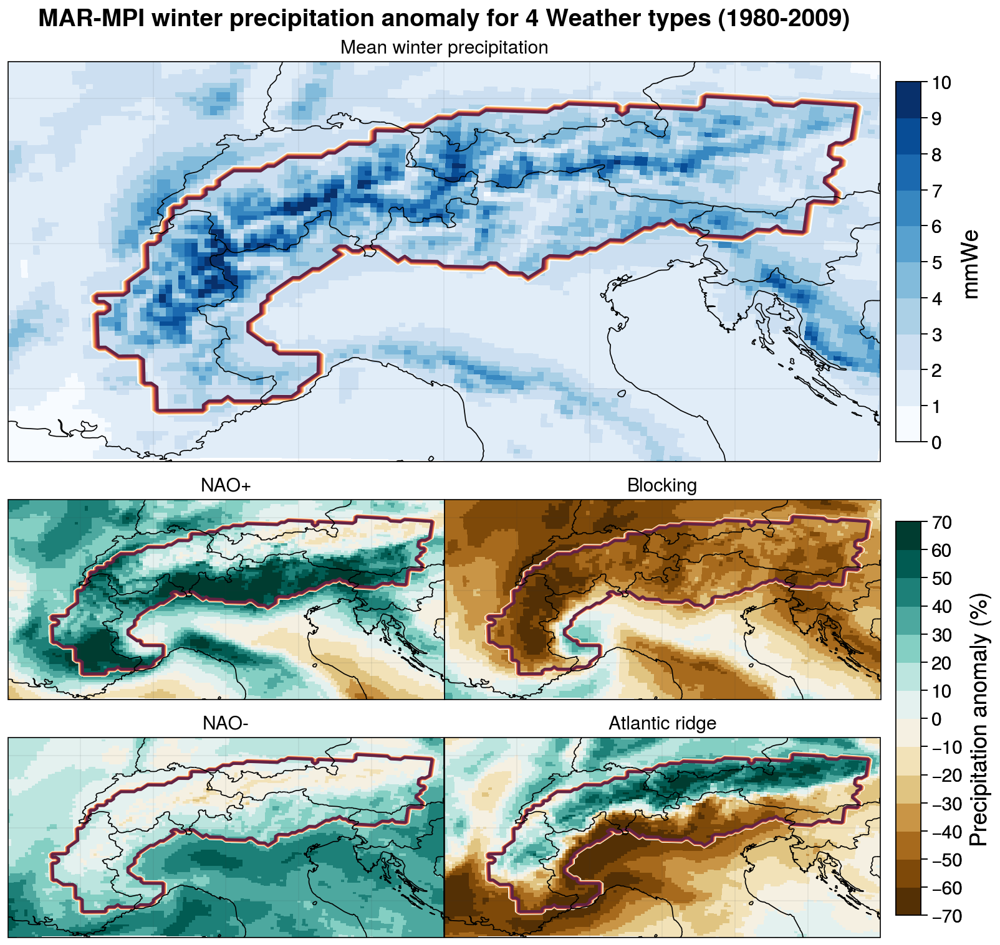

In [16]:
plot_five(ds_precip, 'MAR-MPI winter precipitation anomaly for 4 Weather types (1980-2009)','Mean winter precipitation', 'Precipitation anomaly (%)',
         dict_WT={'NAO+': 'pr3', 'Blocking': 'pr1', 'NAO-': 'pr0', 'Atlantic ridge': 'pr2'})

/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

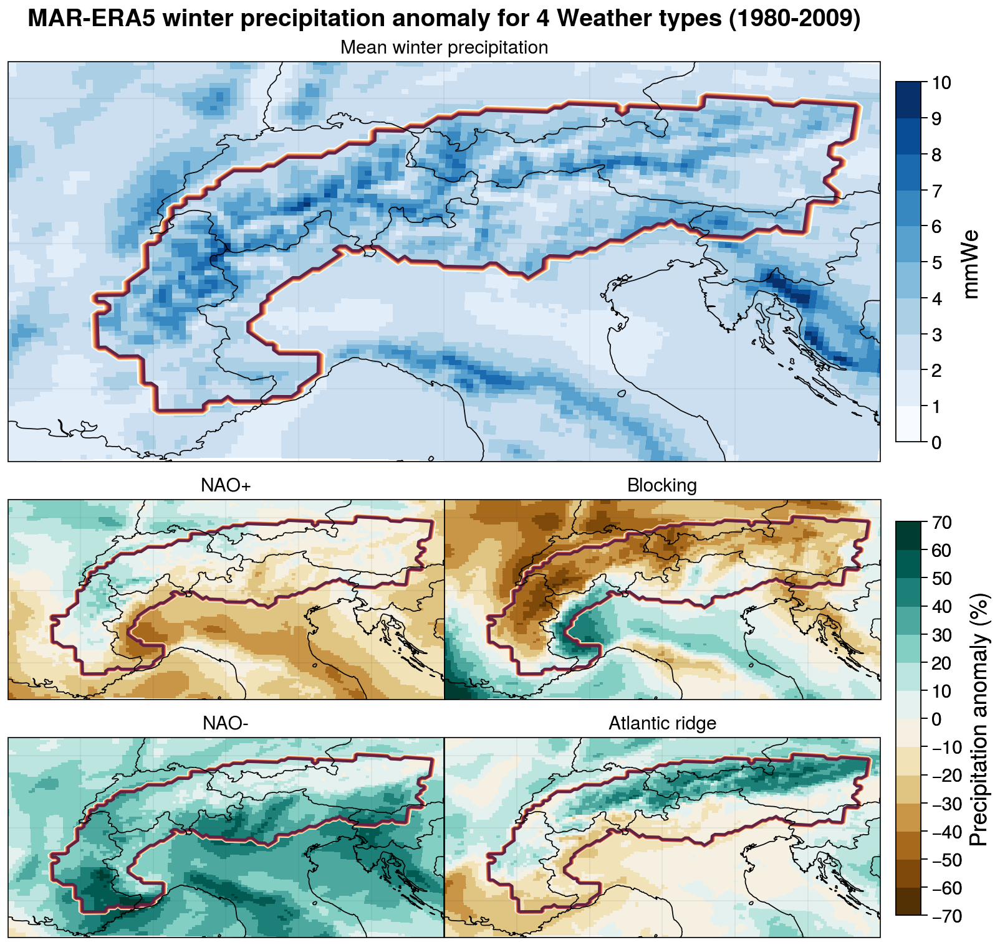

In [17]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MARv3.10_ERA5_precip_weather_types_1980-2009_winter.nc')

plot_five(ds_precip, 'MAR-ERA5 winter precipitation anomaly for 4 Weather types (1980-2009)', 'Mean winter precipitation','Precipitation anomaly (%)',
         dict_WT={'NAO+': 'pr1', 'Blocking': 'pr2', 'NAO-': 'pr3', 'Atlantic ridge': 'pr0'})

/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

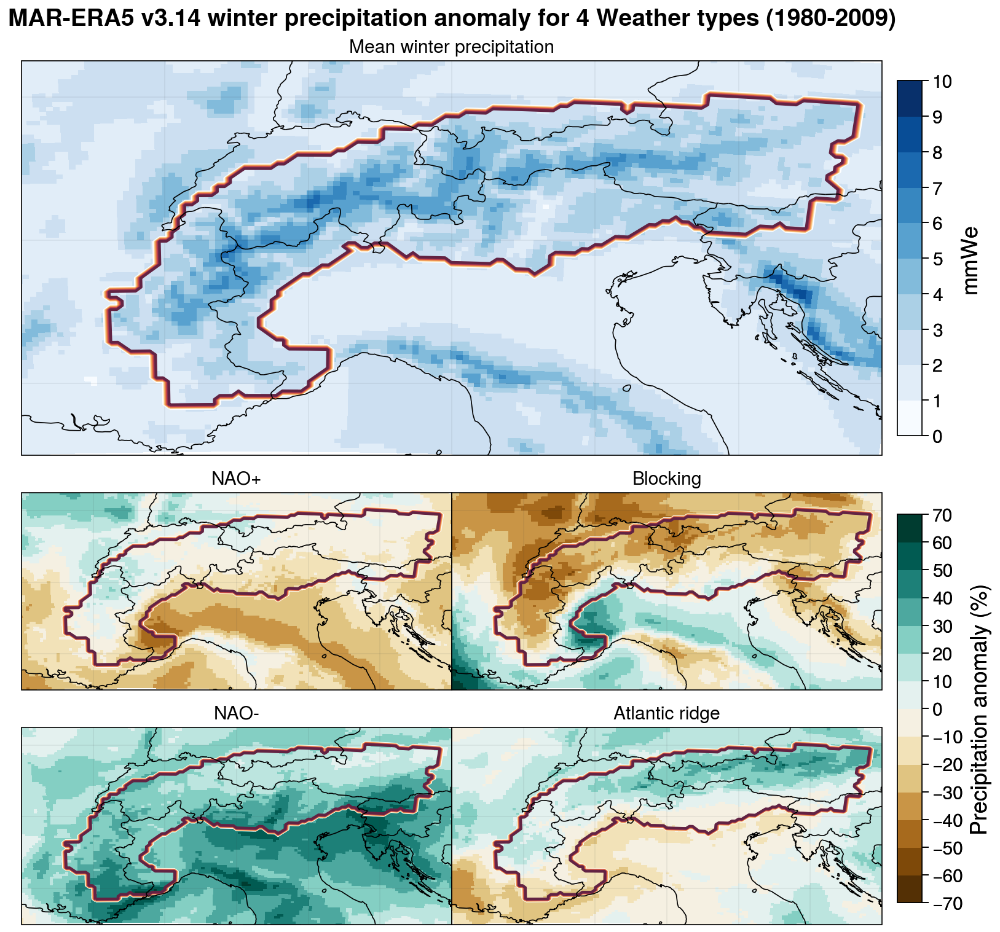

In [18]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MARv3.14_ERA5_precip_weather_types_1980-2009_winter.nc')

plot_five(ds_precip, 'MAR-ERA5 v3.14 winter precipitation anomaly for 4 Weather types (1980-2009)', 'Mean winter precipitation','Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr1', 'Blocking': 'pr2', 'NAO-': 'pr3', 'Atlantic ridge': 'pr0'})

/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

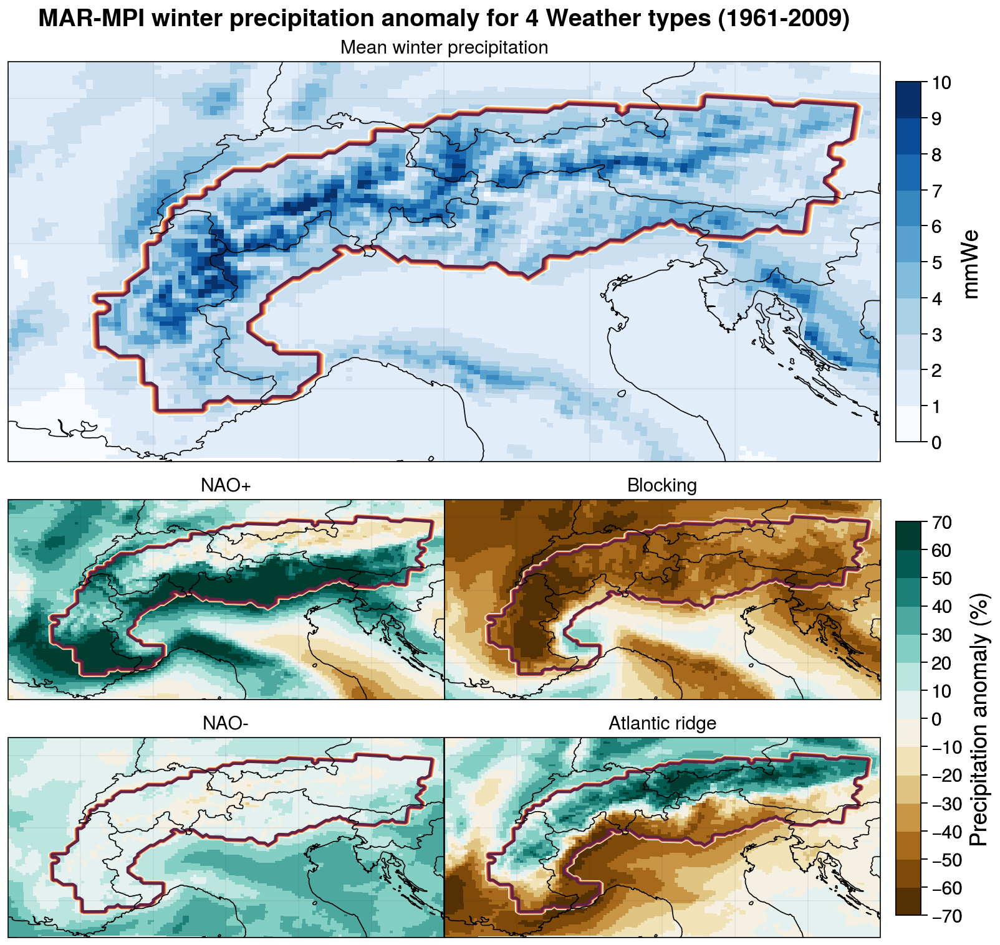

In [19]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_winter.nc')

plot_five(ds_precip, 'MAR-MPI winter precipitation anomaly for 4 Weather types (1961-2009)', 'Mean winter precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr2', 'Blocking': 'pr0', 'NAO-': 'pr3', 'Atlantic ridge': 'pr1'})

/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

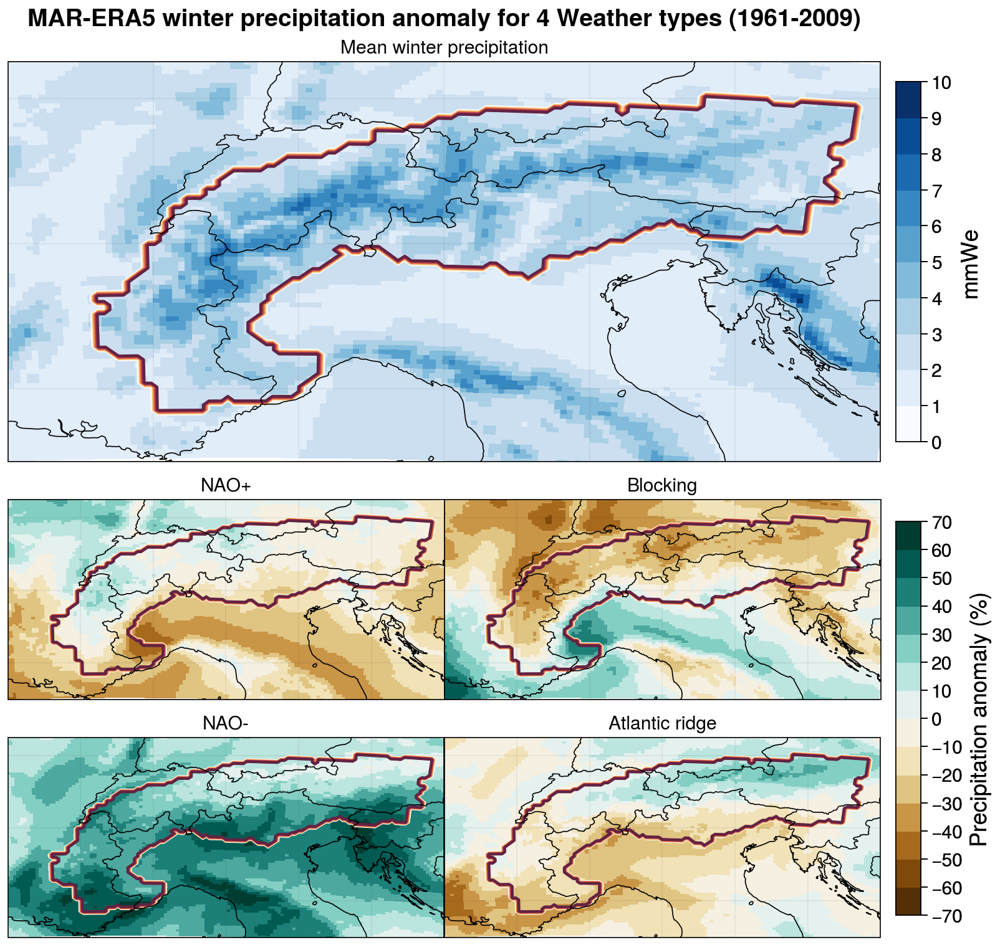

In [20]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MARv3.14_ERA5_precip_weather_types_1961-2009_winter.nc')

plot_five(ds_precip, 'MAR-ERA5 winter precipitation anomaly for 4 Weather types (1961-2009)', 'Mean winter precipitation', 'Precipitation anomaly (%)',
          dict_WT=dict_WT_ERA5_1960_2009_NDJFM)

/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1013675/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

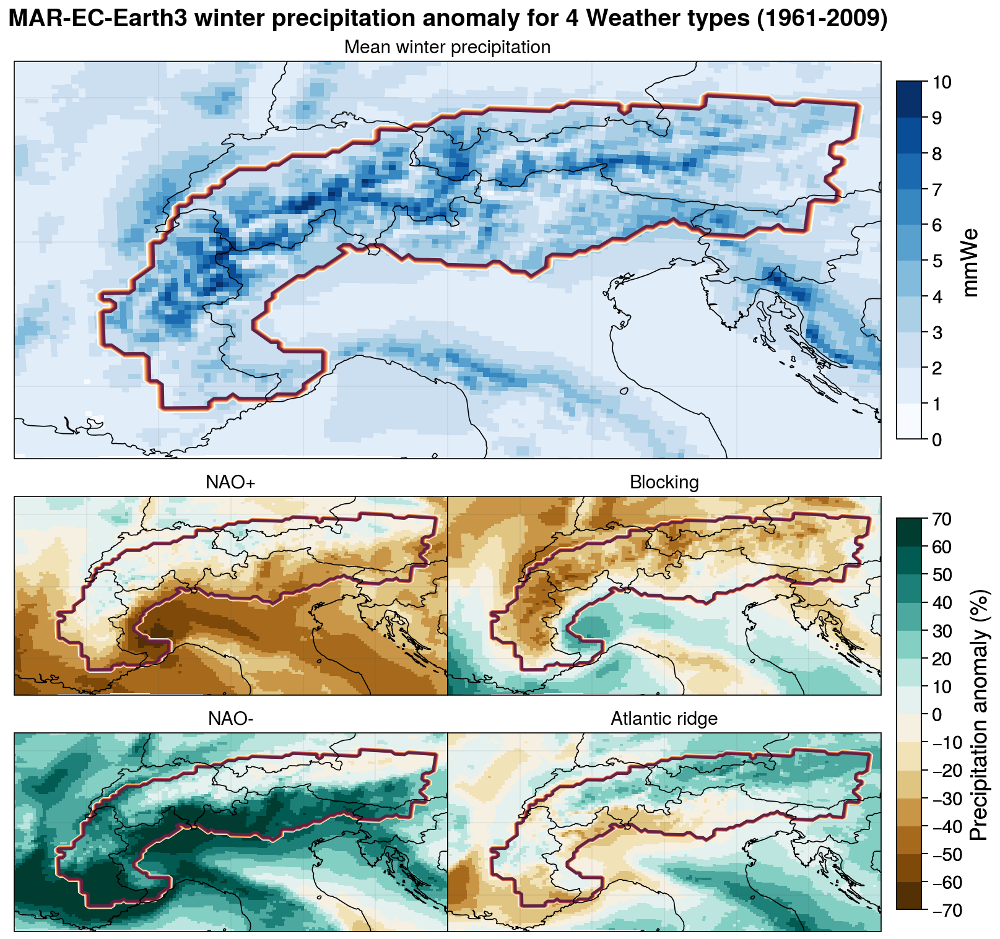

In [21]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_1961-2009_winter.nc')

plot_five(ds_precip, 'MAR-EC-Earth3 winter precipitation anomaly for 4 Weather types (1961-2009)', 'Mean winter precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr3', 'Blocking': 'pr1', 'NAO-': 'pr2', 'Atlantic ridge': 'pr0'})

## SummerJJA

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

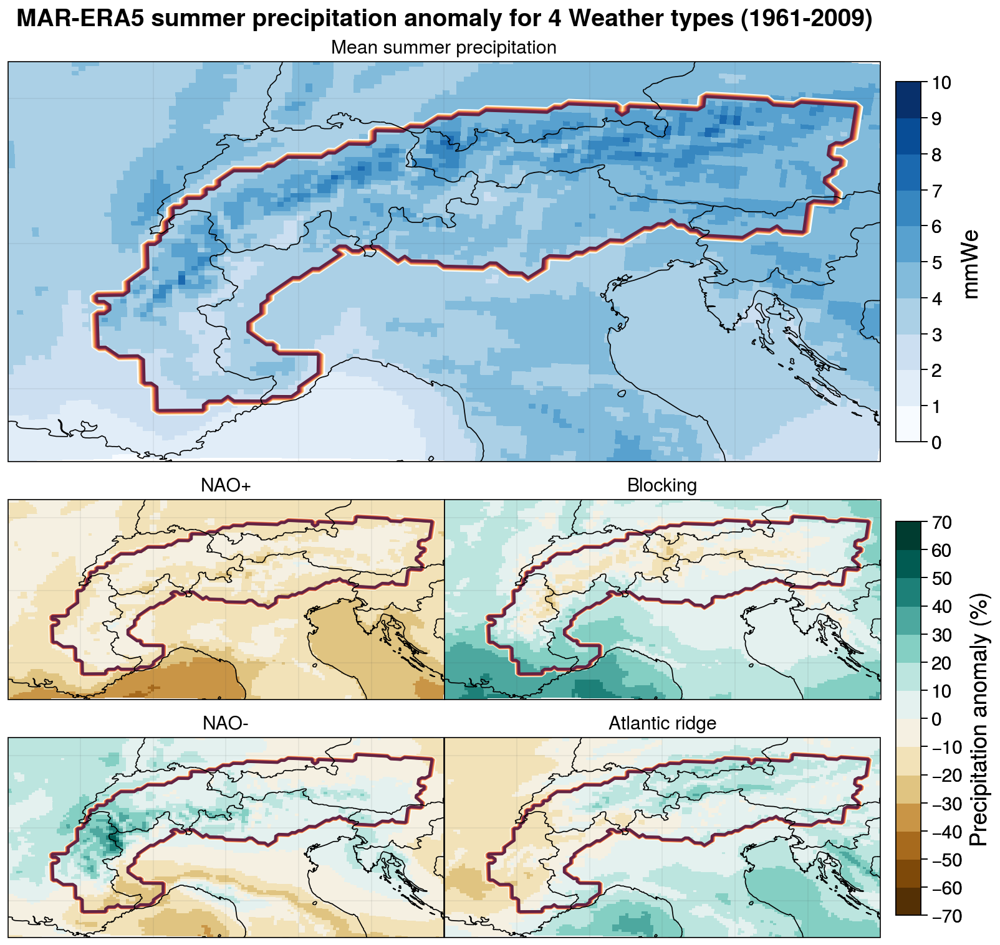

In [22]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MARv3.14_ERA5_precip_weather_types_1961-2009_summerJJA.nc')

plot_five(ds_precip, 'MAR-ERA5 summer precipitation anomaly for 4 Weather types (1961-2009)', 'Mean summer precipitation', 'Precipitation anomaly (%)',
          dict_WT=dict_WT_ERA5_1960_2009_JJA)


/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

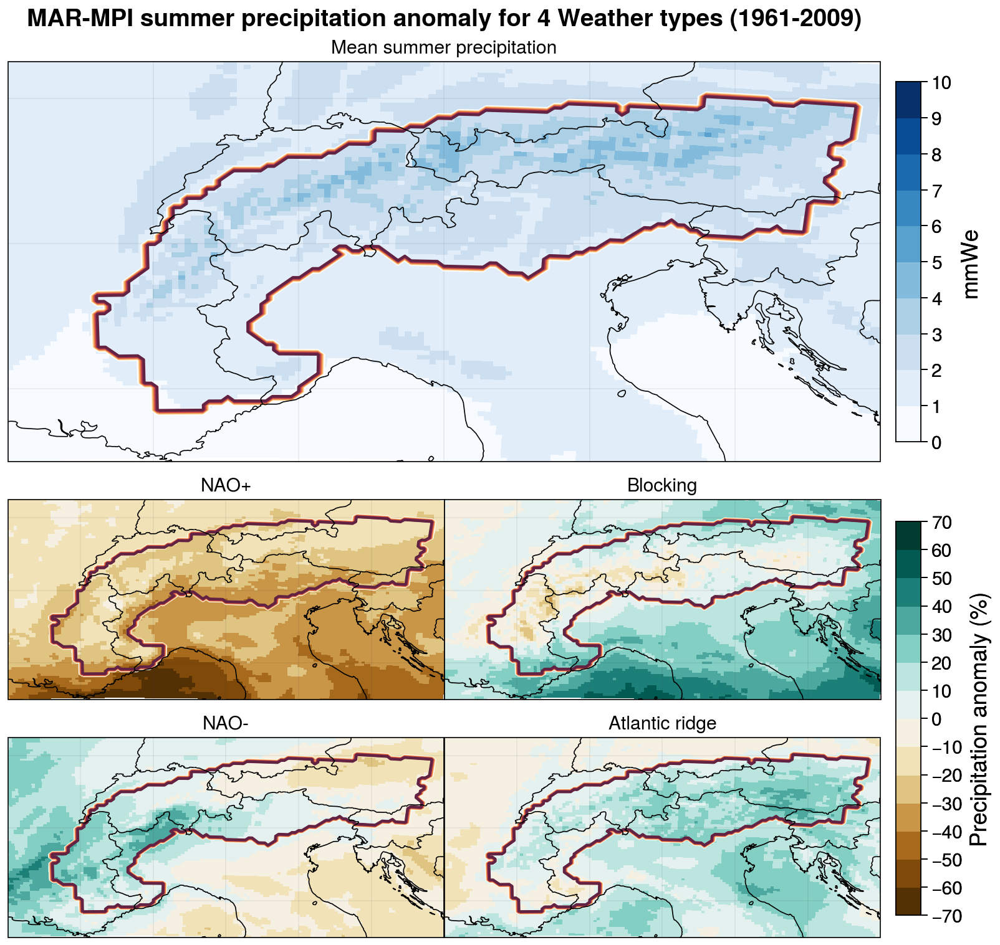

In [23]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_summerJJA.nc')

plot_five(ds_precip, 'MAR-MPI summer precipitation anomaly for 4 Weather types (1961-2009)', 'Mean summer precipitation', 'Precipitation anomaly (%)',
          dict_WT=dict_WT_MPI_hist_1960_2009_JJA)


/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

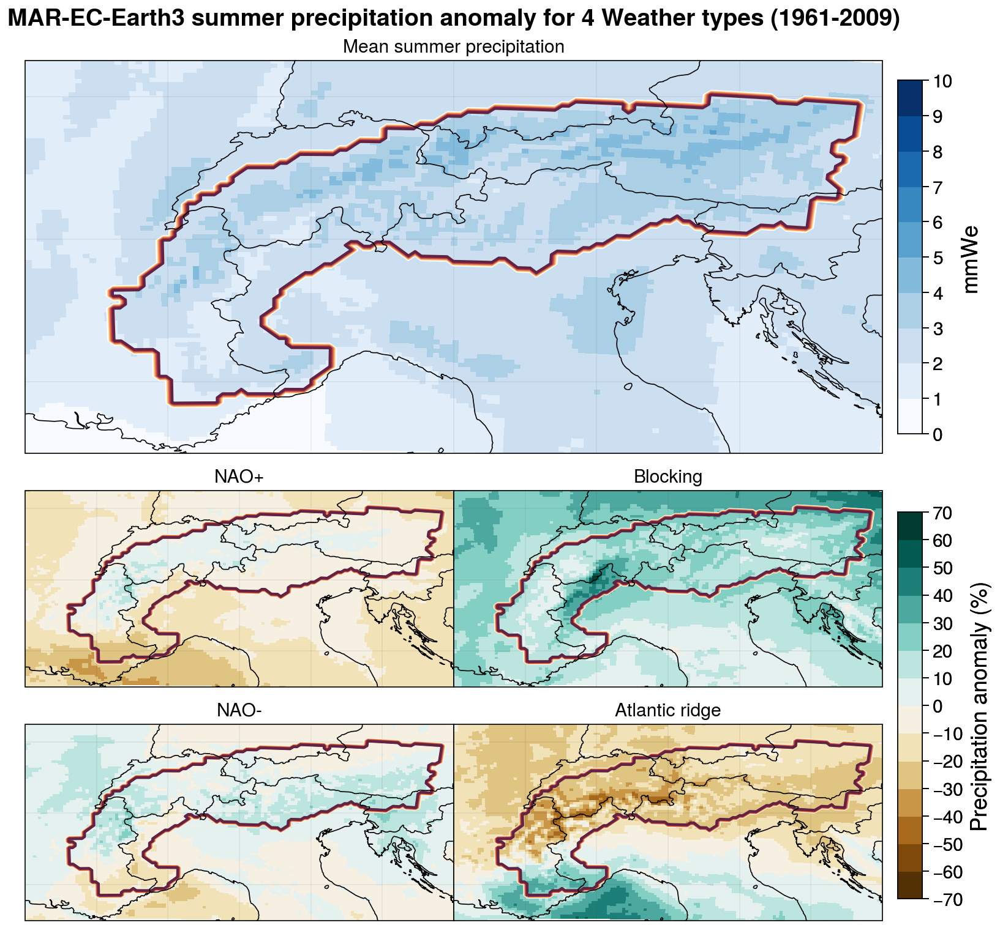

In [24]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_1961-2009_summerJJA.nc')

plot_five(ds_precip, 'MAR-EC-Earth3 summer precipitation anomaly for 4 Weather types (1961-2009)', 'Mean summer precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr0', 'Blocking': 'pr2', 'NAO-': 'pr1', 'Atlantic ridge': 'pr3'})

# Projection

### Winter

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

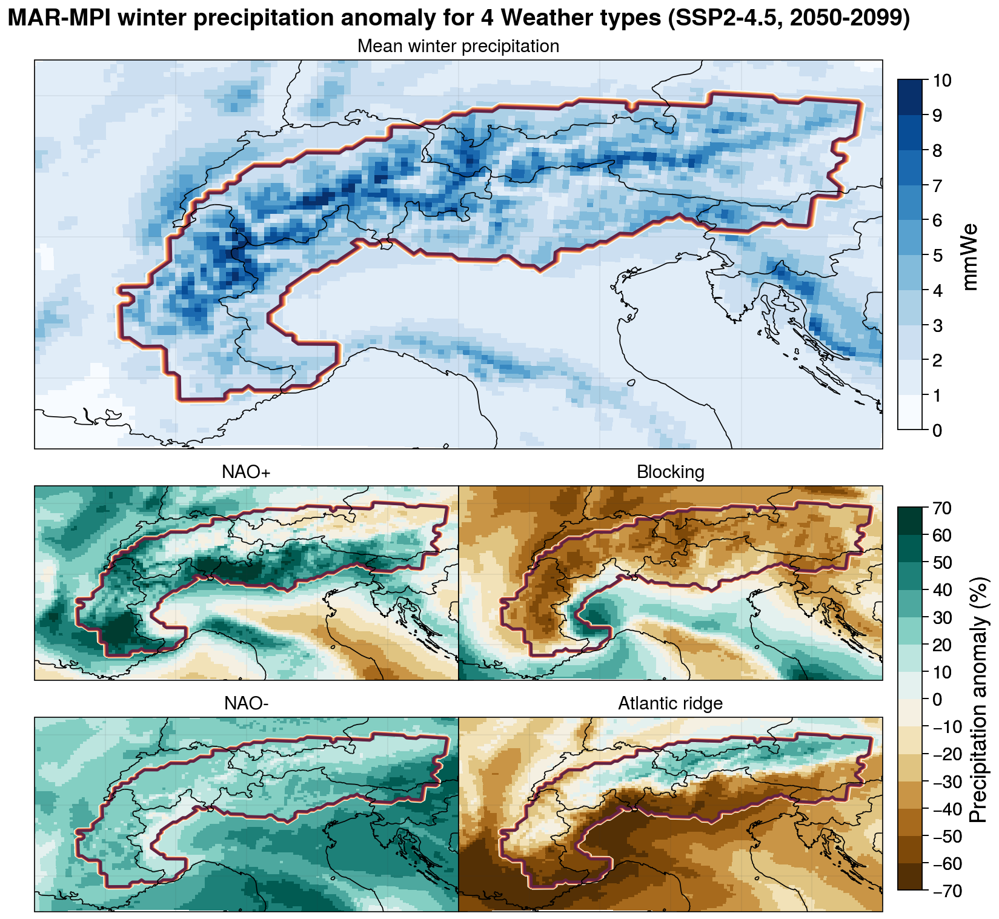

In [25]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2050-2099_winter.nc')

plot_five(ds_precip, 'MAR-MPI winter precipitation anomaly for 4 Weather types (SSP2-4.5, 2050-2099)', 'Mean winter precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr0', 'Blocking': 'pr1', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'})

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

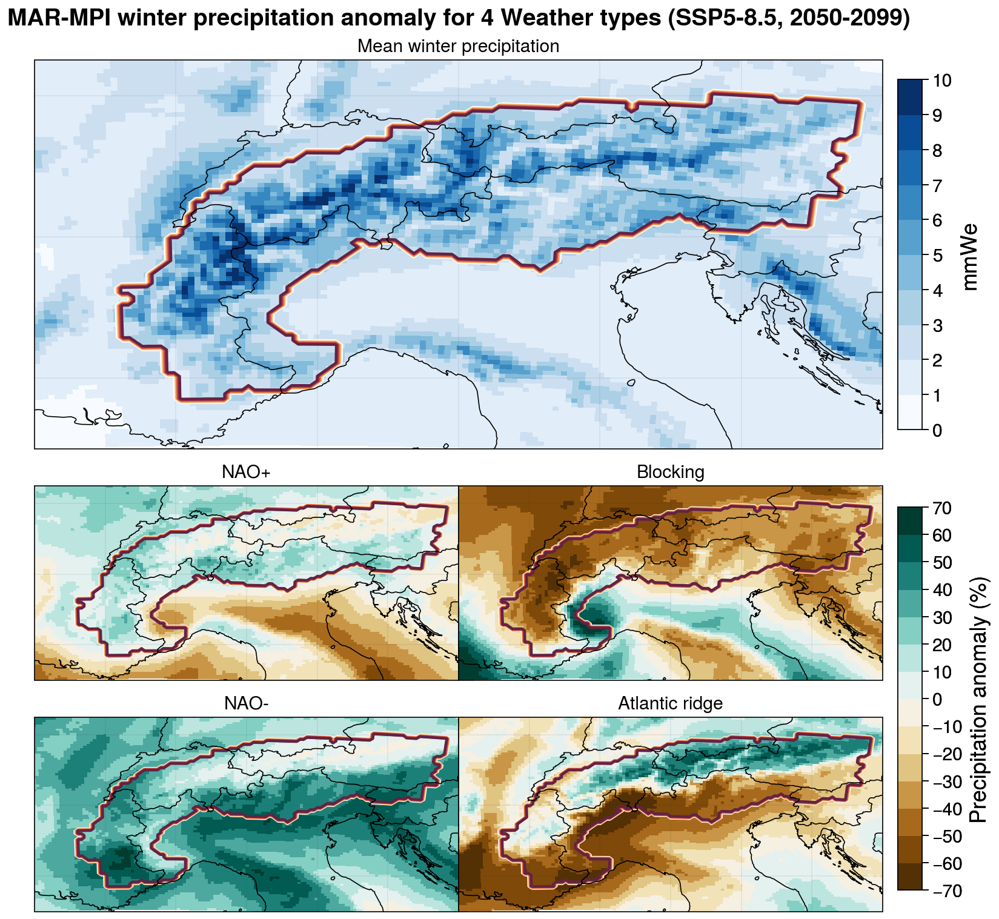

In [26]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp585_2050-2099_winter.nc')

plot_five(ds_precip, 'MAR-MPI winter precipitation anomaly for 4 Weather types (SSP5-8.5, 2050-2099)', 'Mean winter precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr3', 'Blocking': 'pr0', 'NAO-': 'pr2', 'Atlantic ridge': 'pr1'})

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

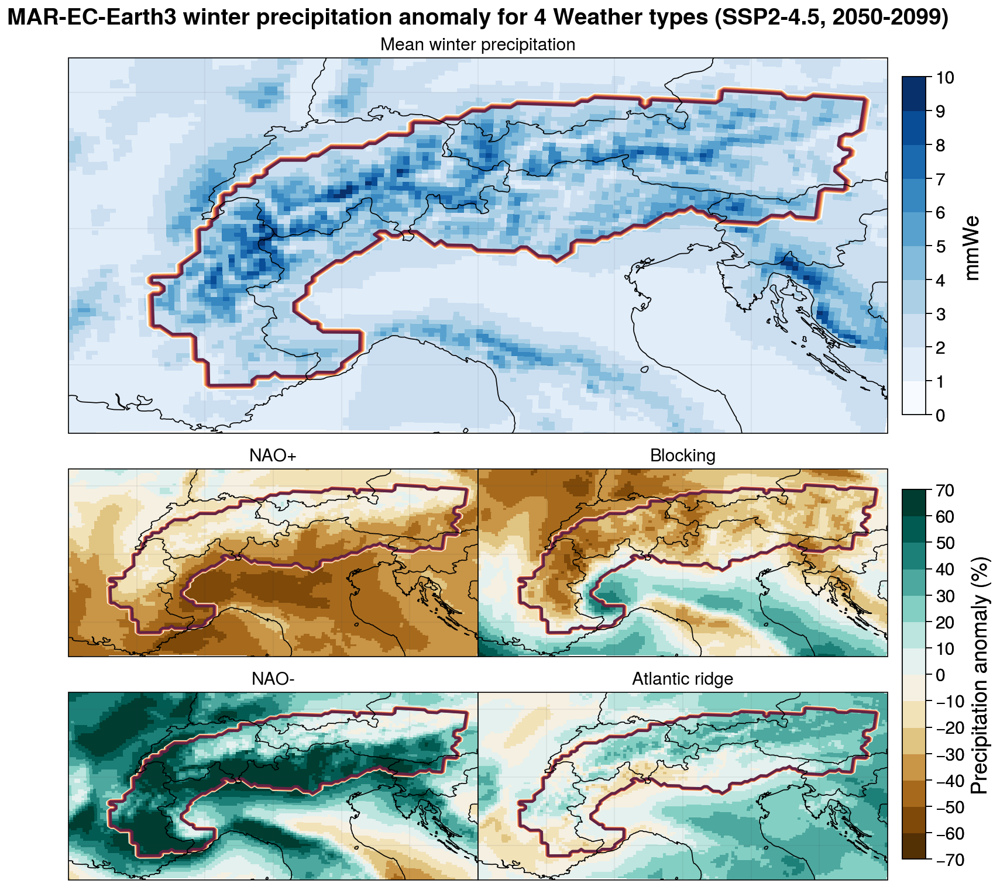

In [27]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_ssp245_2050-2099_winter.nc')

plot_five(ds_precip, 'MAR-EC-Earth3 winter precipitation anomaly for 4 Weather types (SSP2-4.5, 2050-2099)', 'Mean winter precipitation',
          'Precipitation anomaly (%)', dict_WT={'NAO+': 'pr2', 'Blocking': 'pr3', 'NAO-': 'pr1', 'Atlantic ridge': 'pr0'})

### SummerJJA

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

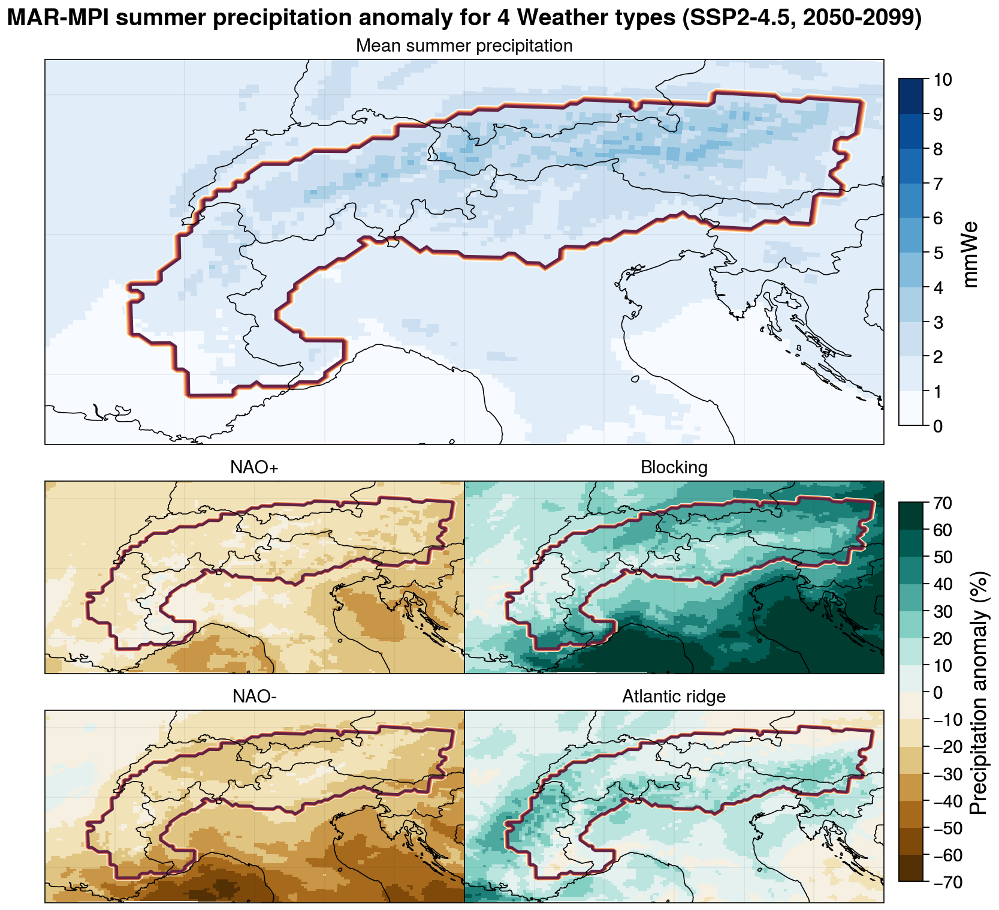

In [28]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2050-2099_summerJJA.nc')

plot_five(ds_precip, 'MAR-MPI summer precipitation anomaly for 4 Weather types (SSP2-4.5, 2050-2099)', 'Mean summer precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr2', 'Blocking': 'pr1', 'NAO-': 'pr0', 'Atlantic ridge': 'pr3'})

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

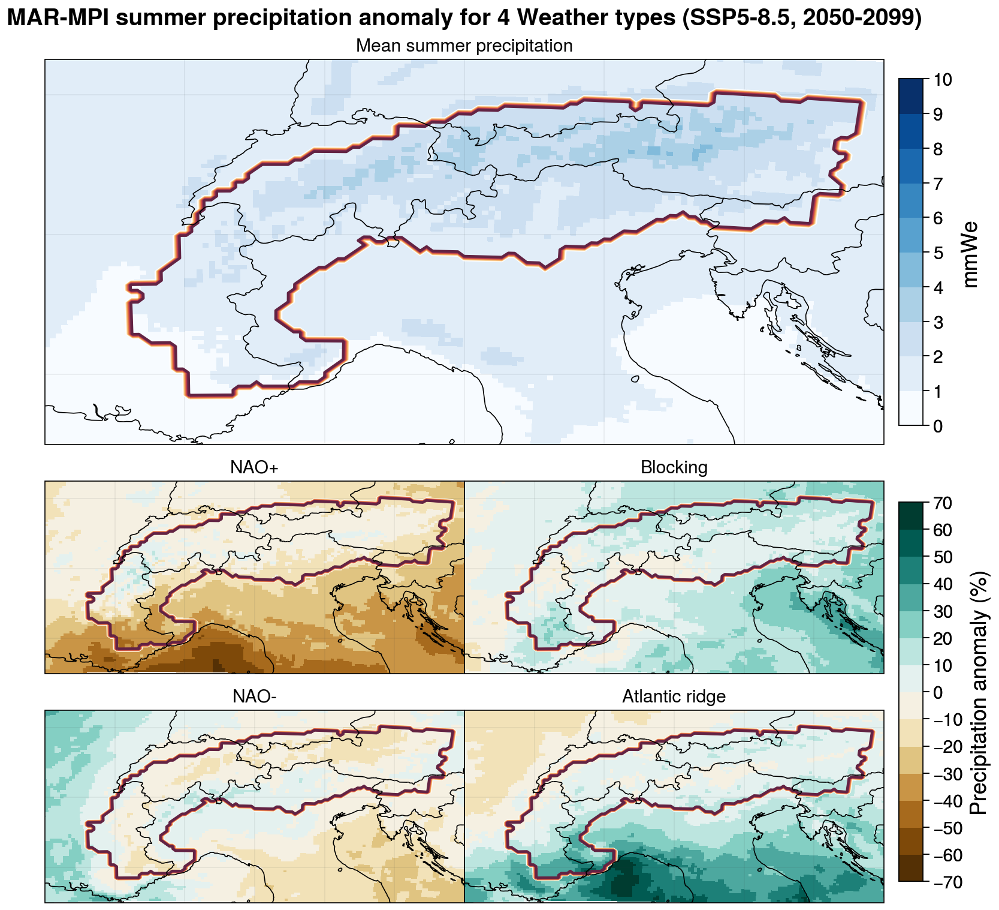

In [29]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp585_2050-2099_summerJJA.nc')

plot_five(ds_precip, 'MAR-MPI summer precipitation anomaly for 4 Weather types (SSP5-8.5, 2050-2099)', 'Mean summer precipitation', 'Precipitation anomaly (%)',
          dict_WT={'NAO+': 'pr1', 'Blocking': 'pr0', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'})

/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/4123238033.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

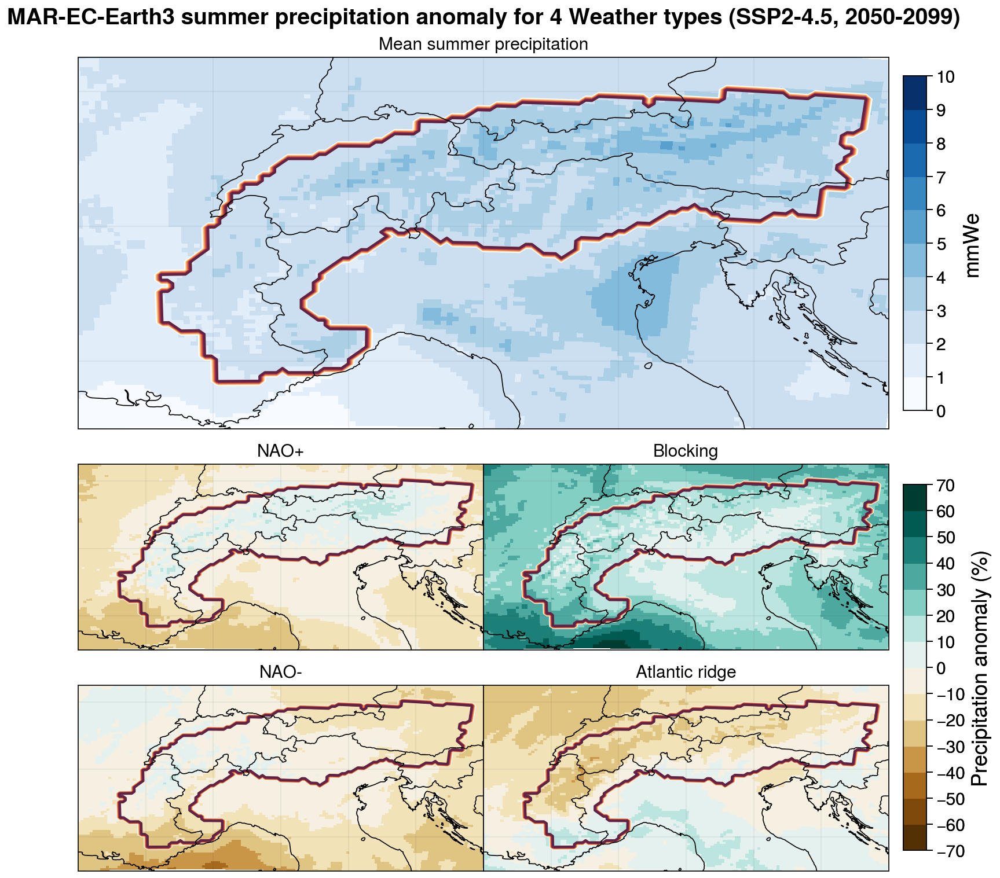

In [30]:
ds_precip = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_ssp245_2050-2099_summerJJA.nc')

plot_five(ds_precip, 'MAR-EC-Earth3 summer precipitation anomaly for 4 Weather types (SSP2-4.5, 2050-2099)', 'Mean summer precipitation',
          'Precipitation anomaly (%)', dict_WT={'NAO+': 'pr1', 'Blocking': 'pr3', 'NAO-': 'pr2', 'Atlantic ridge': 'pr0'})

## Change w.r.t. historical period

/tmp/ipykernel_1911586/3387014554.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/3387014554.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

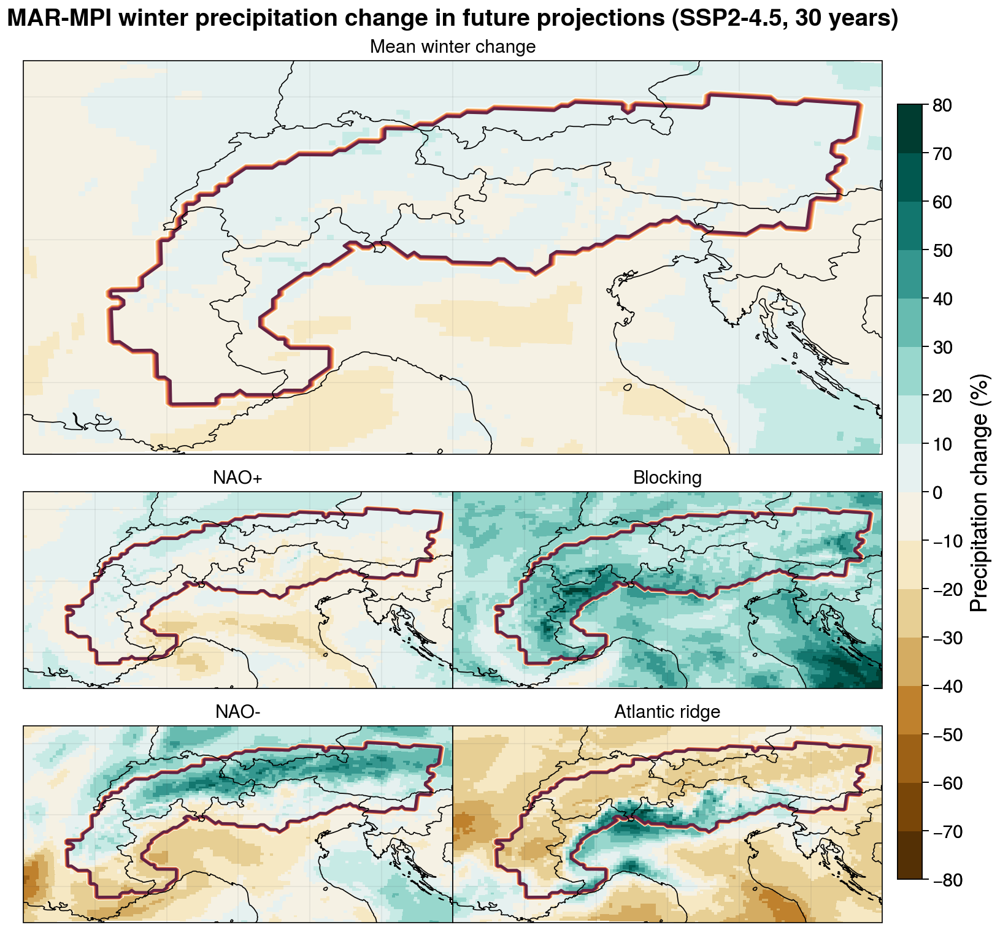

In [31]:
ds_1 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1980-2009_winter.nc')
ds_2 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2070-2099_winter.nc')

plot_five_change(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI winter precipitation change in future projections (SSP2-4.5, 30 years)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)',
                 dict_WT1 = {'NAO+': 'pr3', 'Blocking': 'pr1', 'NAO-': 'pr0', 'Atlantic ridge': 'pr2'},
                 dict_WT2 = {'NAO+': 'pr2', 'Blocking': 'pr1', 'NAO-': 'pr3', 'Atlantic ridge': 'pr0'})


/tmp/ipykernel_1911586/3387014554.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/3387014554.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

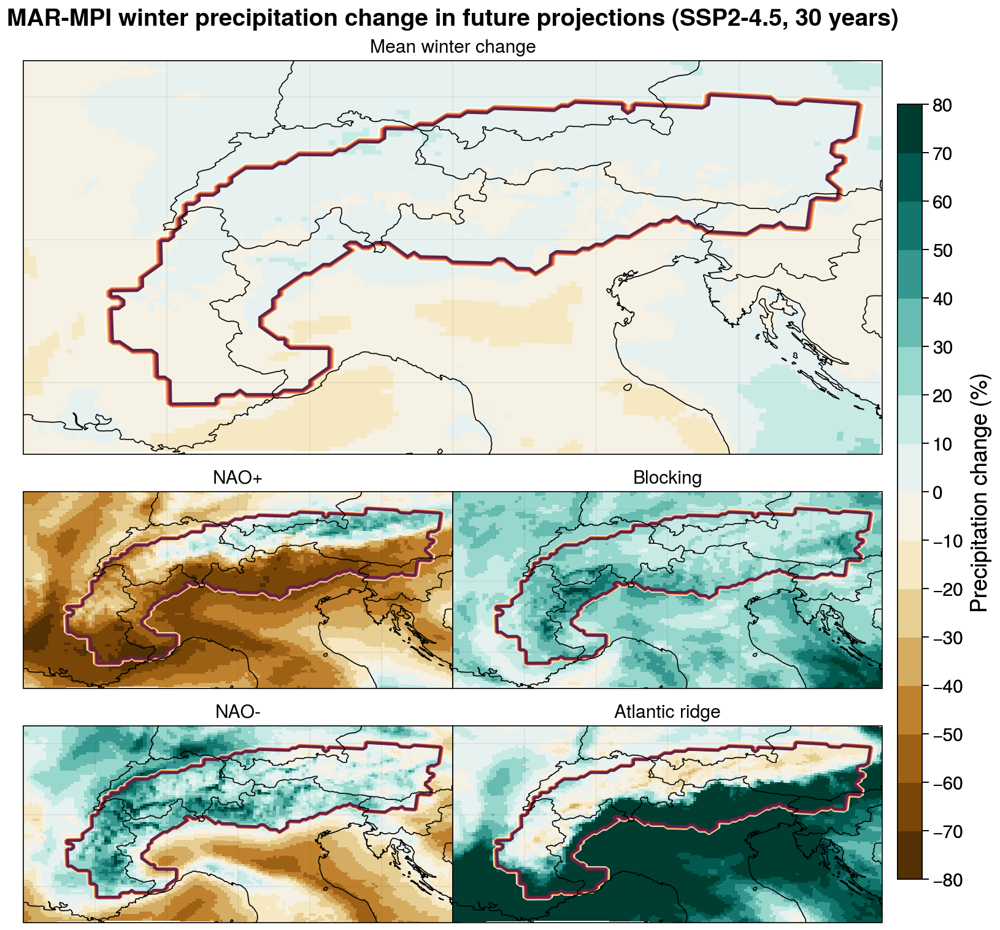

In [32]:
ds_1 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1980-2009_winter.nc')
ds_2 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2070-2099_winter.nc')

plot_five_change(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI winter precipitation change in future projections (SSP2-4.5, 30 years)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)',
                 dict_WT1 = {'NAO+': 'pr3', 'Blocking': 'pr1', 'NAO-': 'pr0', 'Atlantic ridge': 'pr2'},
                 dict_WT2 = {'NAO+': 'pr0', 'Blocking': 'pr1', 'NAO-': 'pr2', 'Atlantic ridge': 'pr3'})

In [ ]:
ds_1 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_winter.nc')
ds_2 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2050-2099_winter.nc')

plot_five_change(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI winter precipitation change in future projections (SSP2-4.5)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)',
                 dict_WT1 = {'NAO+': 'pr1', 'Blocking': 'pr0', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'},
                 dict_WT2 = {'NAO+': 'pr0', 'Blocking': 'pr1', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'})


/tmp/ipykernel_1911586/3387014554.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/tmp/ipykernel_1911586/3387014554.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=14)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is

In [ ]:
ds_1 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_winter.nc')
ds_2 = xr.open_dataset('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp585_2050-2099_winter.nc')

plot_five_change(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI winter precipitation change in future projections (SSP5-8.5)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)',
                 dict_WT1 = {'NAO+': 'pr1', 'Blocking': 'pr0', 'NAO-': 'pr3', 'Atlantic ridge': 'pr2'},
                 dict_WT2 = {'NAO+': 'pr3', 'Blocking': 'pr0', 'NAO-': 'pr2', 'Atlantic ridge': 'pr1'})

## With Teweles-Wobus

### Winter

In [ ]:
da1, freq1 = centers_and_freq(m='MPI', case = 'hist', season = 'winter', yearstart = '1960', yearend = '2009', refone = 'T',
                             mapping = dict_WT_MPI_hist_1960_2009_NDJFM)
da2, freq2 = centers_and_freq(m='MPI', case = 'ssp245', season = 'winter', yearstart = '2050', yearend = '2099', refone = 'F',
                             mapping = dict_WT_MPI_ssp245_2050_2099_NDJFM)

TW_dict = tws_paper_weighted(da1, da2)

ds_1 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_winter.nc', dict_WT_MPI_hist_1960_2009_NDJFM)
ds_2 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2050-2099_winter.nc', dict_WT_MPI_ssp245_2050_2099_NDJFM)

plot_five_change2(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI winter precipitation change in future projections (SSP2-4.5, 50 years)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)', freq1 = freq1, freq2 = freq2, TW = TW_dict)


In [ ]:
da1, freq1 = centers_and_freq(m='MPI', case = 'hist', season = 'winter', yearstart = '1960', yearend = '2009', refone = 'T',
                             mapping = dict_WT_MPI_hist_1960_2009_NDJFM)
da2, freq2 = centers_and_freq(m='MPI', case = 'ssp585', season = 'winter', yearstart = '2050', yearend = '2099', refone = 'F',
                             mapping = dict_WT_MPI_ssp585_2050_2099_NDJFM)

TW_dict = tws_paper_weighted(da1, da2)

ds_1 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_winter.nc', dict_WT_MPI_hist_1960_2009_NDJFM)
ds_2 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp585_2050-2099_winter.nc', dict_WT_MPI_ssp585_2050_2099_NDJFM)

plot_five_change2(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI winter precipitation change in future projections (SSP5-8.5, 50 years)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)', freq1 = freq1, freq2 = freq2, TW = TW_dict)

In [ ]:
da1, freq1 = centers_and_freq(m='EC-Earth3', case = 'hist', season = 'winter', yearstart = '1960', yearend = '2009', refone = 'T',
                             mapping = dict_WT_ECEarth3_hist_1960_2009_NDJFM)
da2, freq2 = centers_and_freq(m='EC-Earth3', case = 'ssp245', season = 'winter', yearstart = '2050', yearend = '2099', refone = 'F',
                             mapping = dict_WT_ECEarth3_ssp245_2050_2099_NDJFM)

TW_dict = tws_paper_weighted(da1, da2)

ds_1 = remap('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_1961-2009_winter.nc', dict_WT_ECEarth3_hist_1960_2009_NDJFM)
ds_2 = remap('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_ssp245_2050-2099_winter.nc', dict_WT_ECEarth3_ssp245_2050_2099_NDJFM)

plot_five_change2(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-ECEarth3 winter precipitation change in future projections (SSP2-4.5, 50 years)',
                 title1 = 'Mean winter change', cbar_label = 'Precipitation change (%)', freq1 = freq1, freq2 = freq2, TW = TW_dict)

### Summer

In [ ]:
da1, freq1 = centers_and_freq(m='MPI', case = 'hist', season = 'summerJJA', yearstart = '1960', yearend = '2009', refone = 'T',
                             mapping = dict_WT_MPI_hist_1960_2009_JJA)
da2, freq2 = centers_and_freq(m='MPI', case = 'ssp245', season = 'summerJJA', yearstart = '2050', yearend = '2099', refone = 'F',
                             mapping = dict_WT_MPI_ssp245_2050_2099_JJA)

TW_dict = tws_paper_weighted(da1, da2)

ds_1 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_summerJJA.nc', dict_WT_MPI_hist_1960_2009_JJA)
ds_2 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp245_2050-2099_summerJJA.nc', dict_WT_MPI_ssp245_2050_2099_JJA)

plot_five_change2(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI summer precipitation change in future projections (SSP2-4.5, 50 years)',
                 title1 = 'Mean summer change', cbar_label = 'Precipitation change (%)', freq1 = freq1, freq2 = freq2, TW = TW_dict)

In [ ]:
da1, freq1 = centers_and_freq(m='MPI', case = 'hist', season = 'summerJJA', yearstart = '1960', yearend = '2009', refone = 'T',
                             mapping = dict_WT_MPI_hist_1960_2009_JJA)
da2, freq2 = centers_and_freq(m='MPI', case = 'ssp585', season = 'summerJJA', yearstart = '2050', yearend = '2099', refone = 'F',
                             mapping = dict_WT_MPI_ssp585_2050_2099_JJA)

TW_dict = tws_paper_weighted(da1, da2)

ds_1 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_1961-2009_summerJJA.nc', dict_WT_MPI_hist_1960_2009_JJA)
ds_2 = remap('/bettik/castelli/data/WTD/MAR/MAR_MPI_precip_weather_types_ssp585_2050-2099_summerJJA.nc', dict_WT_MPI_ssp585_2050_2099_JJA)

plot_five_change2(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-MPI summer precipitation change in future projections (SSP5-8.5, 50 years)',
                 title1 = 'Mean summer change', cbar_label = 'Precipitation change (%)', freq1 = freq1, freq2 = freq2, TW = TW_dict)

In [ ]:
da1, freq1 = centers_and_freq(m='EC-Earth3', case = 'hist', season = 'summerJJA', yearstart = '1960', yearend = '2009', refone = 'T',
                             mapping = dict_WT_ECEarth3_hist_1960_2009_JJA)
da2, freq2 = centers_and_freq(m='EC-Earth3', case = 'ssp245', season = 'summerJJA', yearstart = '2050', yearend = '2099', refone = 'F',
                             mapping = dict_WT_ECEarth3_ssp245_2050_2099_JJA)

TW_dict = tws_paper_weighted(da1, da2)

ds_1 = remap('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_1961-2009_summerJJA.nc', dict_WT_ECEarth3_hist_1960_2009_JJA)
ds_2 = remap('/bettik/castelli/data/WTD/MAR/MAR_ECEarth3_precip_weather_types_ssp245_2050-2099_summerJJA.nc', dict_WT_ECEarth3_ssp245_2050_2099_JJA)

plot_five_change2(ds_precip1 = ds_1, ds_precip2 = ds_2, title = 'MAR-ECEarth3 summer precipitation change in future projections (SSP2-4.5, 50 years)',
                 title1 = 'Mean summer change', cbar_label = 'Precipitation change (%)', freq1 = freq1, freq2 = freq2, TW = TW_dict)

## Subregions for table in article

### Subregions from yearly precipitation cycle

In [24]:
pr_MPI_hist = make_ds_precip_yearly(path='/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/HIST/daily/ICE.MPI-ESM_HIST.EUy.',
                                    start_yr = 1961, end_yr = 2009)

Opening MBrr
Time : 26.333 s
Opening MBsf
Time : 52.055 s
Creating precip data arrays
Time : 52.060 s
Creating precip dataset
Time total : 52.061 s


In [25]:
pr_MPI_hist_monthly = pr_MPI_hist.groupby('time.month').sum()
pr_MPI_hist_monthly

<xarray.Dataset>
Dimensions:  (x: 139, y: 91, month: 12)
Coordinates:
  * x        (x) float32 -259.0 -252.0 -245.0 -238.0 ... 686.0 693.0 700.0 707.0
  * y        (y) float32 -168.0 -161.0 -154.0 -147.0 ... 441.0 448.0 455.0 462.0
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    pr       (month, y, x) float32 dask.array<chunksize=(1, 91, 139), meta=np.ndarray>
Attributes:
    Description:  Dataset with total precipitation (pr=rainfall+snowfall)

In [49]:
pr_ERA5_hist = make_ds_precip_yearly(path='/bettik/castelli/data/MAR-ERA5/MAR3.14/EUo/daily/ICE.ERA5_HIST.EUo.',
                                    start_yr = 1961, end_yr = 2009)

pr_ERA5_hist_monthly = pr_ERA5_hist.groupby('time.month').sum()


Opening MBrr
Time : 13.891 s
Opening MBsf
Time : 22.376 s
Creating precip data arrays
Time : 22.379 s
Creating precip dataset
Time total : 22.380 s


In [50]:
pr_ECEarth_hist = make_ds_precip_yearly(path='/bettik/beaumetj/MARout/MAR-EC-Earth3/HIST/daily/ICE.EC-Earth3_HIST.EUe.',
                                    start_yr = 1961, end_yr = 2009)

pr_ECEarth_hist_monthly = pr_ECEarth_hist.groupby('time.month').sum()

Opening MBrr
Time : 49.561 s
Opening MBsf
Time : 76.623 s
Creating precip data arrays
Time : 76.627 s
Creating precip dataset
Time total : 76.627 s


In [42]:
def do_kmeans(data):
    kmeans_kwargs = {
        "init": "random",
        "n_init": 10,
        "max_iter": 300
    }
    
    # A list holds the SSE values for each k
    sse = []
    for k in range(2, 11):
        kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)
    
    kl = KneeLocator(range(2, 11), sse, curve="convex", direction="decreasing")

    k = kl.elbow
    
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(data)
    
    return k, kmeans.cluster_centers_, kmeans.labels_

In [34]:
pr_MPI_hist_monthly_msk = pr_MPI_hist_monthly.where(alps)

In [45]:
ds_pr = pr_MPI_hist_monthly_msk

pr_sum = ds_pr.pr.sum(dim='month')

norm_pr = ds_pr.pr/pr_sum

norm_pr_reshape = np.reshape(norm_pr.to_numpy(),(12,12649))
norm_pr_reshape_T = np.transpose(norm_pr_reshape)
valid = np.isfinite(norm_pr_reshape_T).all(axis=1)
norm_pr_reshape_T_valid = norm_pr_reshape_T[valid]

k_MPI, clustercenters_MPI, labels_MPI = do_kmeans(norm_pr_reshape_T_valid)

full_labels_MPI = np.full(norm_pr_reshape_T.shape[0], np.nan)
full_labels_MPI[valid] = labels_MPI
full_labels_MPI_reshape = np.reshape(full_labels_MPI,(91,139))

In [51]:
pr_ERA5_hist_monthly_msk = pr_ERA5_hist_monthly.where(alps)

ds_pr = pr_ERA5_hist_monthly_msk

pr_sum = ds_pr.pr.sum(dim='month')

norm_pr = ds_pr.pr/pr_sum

norm_pr_reshape = np.reshape(norm_pr.to_numpy(),(12,12649))
norm_pr_reshape_T = np.transpose(norm_pr_reshape)
valid = np.isfinite(norm_pr_reshape_T).all(axis=1)
norm_pr_reshape_T_valid = norm_pr_reshape_T[valid]

k_ERA5, clustercenters_ERA5, labels_ERA5 = do_kmeans(norm_pr_reshape_T_valid)

full_labels_ERA5 = np.full(norm_pr_reshape_T.shape[0], np.nan)
full_labels_ERA5[valid] = labels_ERA5
full_labels_ERA5_reshape = np.reshape(full_labels_ERA5,(91,139))

In [52]:
pr_ECEarth_hist_monthly_msk = pr_ECEarth_hist_monthly.where(alps)

ds_pr = pr_ECEarth_hist_monthly_msk

pr_sum = ds_pr.pr.sum(dim='month')

norm_pr = ds_pr.pr/pr_sum

norm_pr_reshape = np.reshape(norm_pr.to_numpy(),(12,12649))
norm_pr_reshape_T = np.transpose(norm_pr_reshape)
valid = np.isfinite(norm_pr_reshape_T).all(axis=1)
norm_pr_reshape_T_valid = norm_pr_reshape_T[valid]

k_ECEarth, clustercenters_ECEarth, labels_ECEarth = do_kmeans(norm_pr_reshape_T_valid)

full_labels_ECEarth = np.full(norm_pr_reshape_T.shape[0], np.nan)
full_labels_ECEarth[valid] = labels_ECEarth
full_labels_ECEarth_reshape = np.reshape(full_labels_ECEarth,(91,139))

In [53]:
print(k_ERA5,k_MPI,k_ECEarth)

4 4 5


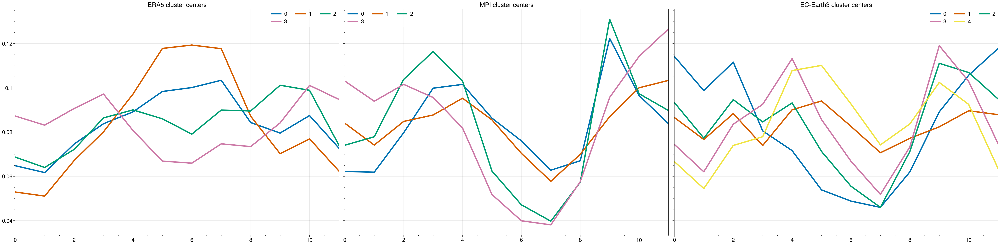

In [57]:
f,axs = pplt.subplots(ncols=3,axheight=7,axwidth=10)

for i in range(k_ERA5):
    axs[0].plot(clustercenters_ERA5[i],linewidth=3,label=i)
    axs[0].format(title='ERA5 cluster centers')#,cmap='Set1')

for i in range(k_MPI):
    axs[1].plot(clustercenters_MPI[i],linewidth=3,label=i)
    axs[1].format(title='MPI cluster centers')#,cmap='Set1')

for i in range(k_ECEarth):
    axs[2].plot(clustercenters_ECEarth[i],linewidth=3,label=i)
    axs[2].format(title='EC-Earth3 cluster centers')

axs[0].legend()
axs[1].legend()
axs[2].legend()

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/tmp/ipykernel_1013675/2188099440.py:13: ProplotWarning: Ignoring levels=4. Instead using norm=<matplotlib.colors.BoundaryNorm object at 0x15273215f070> boundaries.
  m=axs[0].pcolormesh(lon, lat,

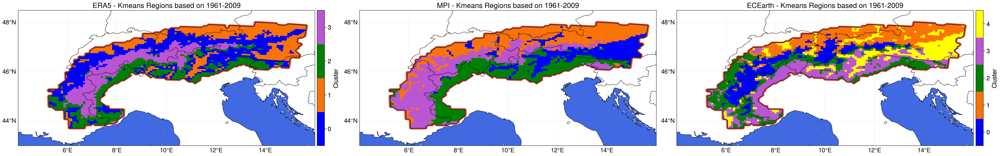

In [64]:
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=3)

custom_cmap1 = ["b","orange","g","mediumorchid"]
custom_cmap2 = ["blue","orange","green","mediumorchid","yellow"]

cmap1 = mcolors.ListedColormap(custom_cmap1)
norm1 = mcolors.BoundaryNorm(np.arange(-0.5, 4.5, 1), cmap1.N)

cmap2 = mcolors.ListedColormap(custom_cmap2)
norm2 = mcolors.BoundaryNorm(np.arange(-0.5, 5.5, 1), cmap2.N)

# Whole period
m=axs[0].pcolormesh(lon, lat, full_labels_ERA5_reshape, levels=4, cmap=cmap1, norm=norm1)
cbar = f.colorbar(m, ax=axs[0])
cbar.set_ticks(np.arange(0,4))
cbar.set_ticklabels(np.arange(0,4))
cbar.set_label("Cluster")

axs[0].contour(lon, lat,alps)
axs[0].format(**normal_format,title='ERA5 - Kmeans Regions based on 1961-2009')
axs[0].format(ocean=True,oceancolor='royalblue',reso='hi')

m=axs[1].pcolormesh(lon, lat, full_labels_MPI_reshape, levels=4, cmap=cmap1, norm=norm1)
axs[1].contour(lon, lat,alps)
axs[1].format(**normal_format,title='MPI - Kmeans Regions based on 1961-2009')
axs[1].format(ocean=True,oceancolor='royalblue',reso='hi')

m=axs[2].pcolormesh(lon, lat, full_labels_ECEarth_reshape, levels=5, cmap=cmap2, norm=norm2)
cbar = f.colorbar(m, ax=axs[2])
cbar.set_ticks(np.arange(0,5))
cbar.set_ticklabels(np.arange(0,5))
cbar.set_label("Cluster")


axs[2].contour(lon, lat,alps)
axs[2].format(**normal_format,title='ECEarth - Kmeans Regions based on 1961-2009')
axs[2].format(ocean=True,oceancolor='royalblue',reso='hi')

In [ ]:
# Force EC-Earth to also have 4 clusters ?
# maybe even force all of them to only have 3 ?
# assign a label and color to each, plot cluster centers and label maps with these consistent colors
# see if subregions defined previously are not too bad to explain this